In [0]:
# If you want to connect your google drive, you can execute this block
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


### Install and setting

In [0]:
!pip install yacs

In [0]:
import os

!git clone https://github.com/NVIDIA/apex.git
os.chdir('/content/apex')
!python setup.py install --cuda_ext --cpp_ext
os.chdir('/content')

In [0]:
os.chdir('/content/apex')
!python setup.py install --cuda_ext --cpp_ext
os.chdir('/content')

In [0]:
!cp -r /content/drive/My\ Drive/DL_projects/cv_fish/Faster_RCNN/fish_frcnn /content/
os.chdir('/content/fish_frcnn')
!python setup.py build develop

In [0]:
# !git clone https://github.com/facebookresearch/maskrcnn-benchmark.git
# os.chdir('/content/maskrcnn-benchmark')
# !python setup.py build develop

In [0]:
import os, sys, re, json, random
import os.path as osp
from shutil import copyfile

import numpy as np
import torch

import cv2
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

from maskrcnn_benchmark.config import cfg

pylab.rcParams['figure.figsize'] = (20, 12)

%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.chdir('/content')

In [0]:
!ls  # after running the whole notebook

apex   fish_bbox   inference	      sample_data  test_stg1  train
drive  fish_frcnn  model_0005000.pth  test_cls	   test_stg2  train_frcnn


## Download data

In [0]:
!mkdir /root/.kaggle
!cp /content/drive/My\ Drive/DL_projects/Data/kaggle.json /root/.kaggle/

In [0]:
!kaggle competitions download -c the-nature-conservancy-fisheries-monitoring -f train.zip

 99% 827M/832M [00:20<00:00, 48.7MB/s]
100% 832M/832M [00:20<00:00, 43.0MB/s]


In [0]:
!kaggle competitions download -c the-nature-conservancy-fisheries-monitoring -f test_stg1.zip

 99% 228M/231M [00:03<00:00, 96.3MB/s]
100% 231M/231M [00:03<00:00, 76.3MB/s]


In [0]:
!unzip -q train.zip

In [0]:
!unzip -q test_stg1.zip

In [0]:
!rm train.zip test_stg1.zip

In [0]:
!rm train/.DS_Store

In [0]:
!rm -r __MACOSX

In [0]:
!cp -r /content/drive/My\ Drive/DL_projects/Data/fish_monitor/fish_bbox ./

In [0]:
!kaggle competitions download -c the-nature-conservancy-fisheries-monitoring -f test_stg2.7z

 99% 1.07G/1.07G [00:13<00:00, 89.1MB/s]
100% 1.07G/1.07G [00:13<00:00, 86.1MB/s]


In [0]:
!apt-get install p7zip-full

Reading package lists... Done
Building dependency tree       
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-6).
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 6 not upgraded.


In [0]:
!p7zip -d test_stg2.7z


7-Zip (a) [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.30GHz (306F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 1152137421 bytes (1099 MiB)

Extracting archive: test_stg2.7z
--
Path = test_stg2.7z
Type = 7z
Physical Size = 1152137421
Headers Size = 82081
Method = LZMA:25
Solid = +
Blocks = 1

  0%      0% - test_stg2/image_00001.jpg                                  0% 38 - test_stg2/image_00039.jpg                                     0% 80 - test_stg2/image_00081.jpg                                     1% 125 - test_stg2/image_00126.jpg                                    

In [0]:
!mkdir train_cls

In [0]:
!mkdir test_cls

## Prepare coco-style data

In [0]:
path = '/content'
label_cls = ['DOL', 'LAG', 'BET', 'OTHER', 'SHARK', 'YFT', 'ALB']
no_bbs = ['img_00568.jpg', 'img_01958.jpg', 'img_07008.jpg', 'img_00425.jpg',
          'img_04798.jpg', 'img_06460.jpg', 'img_02292.jpg', 'img_00576.jpg',
          'img_00379.jpg', 'img_06773.jpg', 'img_05444.jpg', 'img_06082.jpg',
          'img_03183.jpg', 'img_04558.jpg', 'img_02785.jpg']


def create_datasplit_load_gt(path, seed=135):
    train_files = []
    valid_files = []
    np.random.seed(seed)
    for c in label_cls:
        fs = os.listdir(os.path.join(path, 'train', c))
        mask = np.random.rand(len(fs)) > 0.1
        train_files += [c+'/'+f for f in np.array(fs)[mask] if f not in no_bbs]
        valid_files += [c+'/'+f for f in np.array(fs)[~mask] if f not in no_bbs]

    gt = []
    for c in label_cls:
        with open(osp.join(path, 'fish_bbox', c.lower()+'_labels.json')) as f:
            gt.extend(json.load(f))
    gt = {imgt['filename'].split('/')[-1]: imgt for imgt in gt}

    return train_files, valid_files, gt


def prepare_data(path, img_files, gt, split):
    # create required dirs
    if not osp.exists(osp.join(path, 'train_frcnn')):
        os.makedirs(osp.join(path, 'train_frcnn', 'images'))
        os.makedirs(osp.join(path, 'train_frcnn', 'annotations'))

    # annotations to be prepared
    anno = {}
    anno['type'] = 'instances'
    anno['categories'] = [{'supercategory': 'none', 'id': 1, 'name': 'fish'}]

    images_anno, annos_anno = [], []
    obj_id = 1
    for imfile in img_files:
        # image information
        fname = imfile.split('/')[-1]
        width, height = Image.open(osp.join(path, 'train', imfile)).size
        im_id = int(fname.split('.')[0].split('_')[-1])
        images_anno.append(
            {'file_name':fname, 'width':width, 'height':height, 'id':im_id})

        # object annotation
        im_annos = gt[fname]['annotations']
        for o in im_annos:
            bb = [o['x'], o['y'], o['width'], o['height']]
            annos_anno.append(
                {'bbox':bb, 'area':bb[-2]*bb[-1], 'image_id':im_id, 'id':obj_id,
                 'category_id':1, 'iscrowd':0, 'ignore':0})
            obj_id += 1

        # copy images to 'train_frcnn/images'
        copyfile(osp.join(path, 'train', imfile), osp.join(path, 'train_frcnn/images', fname))

    anno['images'] = images_anno
    anno['annotations'] = annos_anno

    # to json file
    with open(osp.join(path, 'train_frcnn/annotations', f'fish_{split}.json'), 'w') as f:
        json.dump(anno, f)

In [0]:
train_files, valid_files, gt = create_datasplit_load_gt(path)
prepare_data(path, train_files, gt, 'train')
prepare_data(path, valid_files, gt, 'val')

In [0]:
!ls train_frcnn/annotations/

fish_train.json  fish_val.json


In [0]:
len(os.listdir('train_frcnn/images'))

3297

## Train

In [0]:
!python fish_frcnn/tools/train_net.py --config-file "/content/fish_frcnn/configs/fish_faster_rcnn_R_50_RPN_1x.yaml"

2019-05-23 10:13:43,537 maskrcnn_benchmark INFO: Using 1 GPUs
2019-05-23 10:13:43,537 maskrcnn_benchmark INFO: Namespace(config_file='/content/fish_frcnn/configs/fish_faster_rcnn_R_50_RPN_1x.yaml', distributed=False, local_rank=0, opts=[], skip_test=False)


2019-05-23 10:13:43,537 maskrcnn_benchmark INFO: Collecting env info (might take some time)
2019-05-23 10:13:45,146 maskrcnn_benchmark INFO: 
PyTorch version: 1.1.0
Is debug build: No
CUDA used to build PyTorch: 10.0.130

OS: Ubuntu 18.04.2 LTS
GCC version: (Ubuntu 7.4.0-1ubuntu1~18.04) 7.4.0
CMake version: version 3.12.0

Python version: 3.6
Is CUDA available: Yes
CUDA runtime version: 10.0.130
GPU models and configuration: GPU 0: Tesla K80
Nvidia driver version: 410.79
cuDNN version: /usr/lib/x86_64-linux-gnu/libcudnn.so.7.5.1

Versions of relevant libraries:
[pip3] msgpack-numpy==0.4.3.2
[pip3] numpy==1.16.3
[pip3] torch==1.1.0
[pip3] torchsummary==1.5.1
[pip3] torchtext==0.3.1
[pip3] torchvision==0.2.2.post3
[conda] Could not c

In [0]:
!cp model_0005000.pth /content/drive/My\ Drive/DL_projects/cv_fish/Faster_RCNN/

## Eval

In [0]:
!cp /content/drive/My\ Drive/DL_projects/cv_fish/Faster_RCNN/model_0002500.pth ./

In [0]:
!cp /content/drive/My\ Drive/DL_projects/cv_fish/Faster_RCNN/model_0005000.pth ./

In [0]:
!cp /content/drive/My\ Drive/DL_projects/cv_fish/Faster_RCNN/fish_test_faster_rcnn_R_50_RPN_1x.yaml fish_frcnn/configs/

In [0]:
# model_0002500.pth
!python fish_frcnn/tools/test_net.py --config-file "/content/fish_frcnn/configs/fish_test_faster_rcnn_R_50_RPN_1x.yaml"

2019-05-24 15:36:45,950 maskrcnn_benchmark INFO: Using 1 GPUs
2019-05-24 15:36:45,950 maskrcnn_benchmark INFO: AMP_VERBOSE: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 32
DATASETS:
  TEST: ('fish_val_cocostyle',)
  TRAIN: ('fish_train_cocostyle',)
DTYPE: float32
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 1333
  MAX_SIZE_TRAIN: 1333
  MIN_SIZE_TEST: 800
  MIN_SIZE_TRAIN: (800,)
  PIXEL_MEAN: [102.9801, 115.9465, 122.7717]
  PIXEL_STD: [1.0, 1.0, 1.0]
  SATURATION: 0.0
  TO_BGR255: True
MODEL:
  BACKBONE:
    CONV_BODY: R-50-FPN
    FREEZE_CONV_BODY_AT: 2
    USE_GN: False
  CLS_AGNOSTIC_BBOX_REG: False
  DEVICE: cuda
  FBNET:
    ARCH: default
    ARCH_DEF: 
    BN_TYPE: bn
    DET_HEAD_BLOCKS: []
    DET_HEAD_LAST_SCALE: 1.0
    DET_HEAD_STRIDE: 0
    DW_CONV_SKIP_BN: True
    DW_CONV_SKIP_RELU: True
    KPTS_HEAD_BLOCKS: []
    KPTS_HEAD_LAST_SCALE: 0.0
    KPTS_HEAD_STRIDE: 0
    MASK_HEAD_BLOCKS: []
    MASK_HEAD_LA

In [0]:
# model_0005000.pth
!python fish_frcnn/tools/test_net.py --config-file "/content/fish_frcnn/configs/fish_test_faster_rcnn_R_50_RPN_1x.yaml"

2019-05-24 15:30:15,077 maskrcnn_benchmark INFO: Using 1 GPUs
2019-05-24 15:30:15,077 maskrcnn_benchmark INFO: AMP_VERBOSE: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 32
DATASETS:
  TEST: ('fish_val_cocostyle',)
  TRAIN: ('fish_train_cocostyle',)
DTYPE: float32
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 1333
  MAX_SIZE_TRAIN: 1333
  MIN_SIZE_TEST: 800
  MIN_SIZE_TRAIN: (800,)
  PIXEL_MEAN: [102.9801, 115.9465, 122.7717]
  PIXEL_STD: [1.0, 1.0, 1.0]
  SATURATION: 0.0
  TO_BGR255: True
MODEL:
  BACKBONE:
    CONV_BODY: R-50-FPN
    FREEZE_CONV_BODY_AT: 2
    USE_GN: False
  CLS_AGNOSTIC_BBOX_REG: False
  DEVICE: cuda
  FBNET:
    ARCH: default
    ARCH_DEF: 
    BN_TYPE: bn
    DET_HEAD_BLOCKS: []
    DET_HEAD_LAST_SCALE: 1.0
    DET_HEAD_STRIDE: 0
    DW_CONV_SKIP_BN: True
    DW_CONV_SKIP_RELU: True
    KPTS_HEAD_BLOCKS: []
    KPTS_HEAD_LAST_SCALE: 0.0
    KPTS_HEAD_STRIDE: 0
    MASK_HEAD_BLOCKS: []
    MASK_HEAD_LA

## Detection

In [0]:
from torchvision import transforms as T

from maskrcnn_benchmark.modeling.detector import build_detection_model
from maskrcnn_benchmark.utils.checkpoint import DetectronCheckpointer
from maskrcnn_benchmark.structures.image_list import to_image_list
from maskrcnn_benchmark.modeling.roi_heads.mask_head.inference import Masker
from maskrcnn_benchmark import layers as L
from maskrcnn_benchmark.utils import cv2_util


class COCODemo(object):
    # COCO categories for pretty print
    CATEGORIES = [
        "__background",
        "fish",
    ]

    def __init__(
        self,
        cfg,
        confidence_threshold=0.7,
        show_mask_heatmaps=False,
        masks_per_dim=2,
        min_image_size=224,
    ):
        self.cfg = cfg.clone()
        self.model = build_detection_model(cfg)
        self.model.eval()
        self.device = torch.device(cfg.MODEL.DEVICE)
        self.model.to(self.device)
        self.min_image_size = min_image_size

        save_dir = cfg.OUTPUT_DIR
        checkpointer = DetectronCheckpointer(cfg, self.model, save_dir=save_dir)
        _ = checkpointer.load(cfg.MODEL.WEIGHT)

        self.transforms = self.build_transform()

        mask_threshold = -1 if show_mask_heatmaps else 0.5
        self.masker = Masker(threshold=mask_threshold, padding=1)

        # used to make colors for each class
        self.palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])

        self.cpu_device = torch.device("cpu")
        self.confidence_threshold = confidence_threshold
        self.show_mask_heatmaps = show_mask_heatmaps
        self.masks_per_dim = masks_per_dim

    def build_transform(self):
        """
        Creates a basic transformation that was used to train the models
        """
        cfg = self.cfg

        # we are loading images with OpenCV, so we don't need to convert them
        # to BGR, they are already! So all we need to do is to normalize
        # by 255 if we want to convert to BGR255 format, or flip the channels
        # if we want it to be in RGB in [0-1] range.
        if cfg.INPUT.TO_BGR255:
            to_bgr_transform = T.Lambda(lambda x: x * 255)
        else:
            to_bgr_transform = T.Lambda(lambda x: x[[2, 1, 0]])

        normalize_transform = T.Normalize(
            mean=cfg.INPUT.PIXEL_MEAN, std=cfg.INPUT.PIXEL_STD
        )

        transform = T.Compose(
            [
                T.ToPILImage(),
                T.Resize(self.min_image_size),
                T.ToTensor(),
                to_bgr_transform,
                normalize_transform,
            ]
        )
        return transform

    def run_on_opencv_image(self, image):
        """
        Arguments:
            image (np.ndarray): an image as returned by OpenCV
        Returns:
            prediction (BoxList): the detected objects. Additional information
                of the detection properties can be found in the fields of
                the BoxList via `prediction.fields()`
        """
        predictions = self.compute_prediction(image)
        top_predictions = self.select_top_predictions(predictions)

        result = image.copy()
        if self.show_mask_heatmaps:
            return self.create_mask_montage(result, top_predictions)
        result = self.overlay_boxes(result, top_predictions)
        if self.cfg.MODEL.MASK_ON:
            result = self.overlay_mask(result, top_predictions)
        if self.cfg.MODEL.KEYPOINT_ON:
            result = self.overlay_keypoints(result, top_predictions)
        result = self.overlay_class_names(result, top_predictions)

        return result

    def compute_prediction(self, original_image):
        """
        Arguments:
            original_image (np.ndarray): an image as returned by OpenCV
        Returns:
            prediction (BoxList): the detected objects. Additional information
                of the detection properties can be found in the fields of
                the BoxList via `prediction.fields()`
        """
        # apply pre-processing to image
        image = self.transforms(original_image)
        # convert to an ImageList, padded so that it is divisible by
        # cfg.DATALOADER.SIZE_DIVISIBILITY
        image_list = to_image_list(image, self.cfg.DATALOADER.SIZE_DIVISIBILITY)
        image_list = image_list.to(self.device)
        # compute predictions
        with torch.no_grad():
            predictions = self.model(image_list)
        predictions = [o.to(self.cpu_device) for o in predictions]

        # always single image is passed at a time
        prediction = predictions[0]

        # reshape prediction (a BoxList) into the original image size
        height, width = original_image.shape[:-1]
        prediction = prediction.resize((width, height))

        if prediction.has_field("mask"):
            # if we have masks, paste the masks in the right position
            # in the image, as defined by the bounding boxes
            masks = prediction.get_field("mask")
            # always single image is passed at a time
            masks = self.masker([masks], [prediction])[0]
            prediction.add_field("mask", masks)
        return prediction

    def select_top_predictions(self, predictions):
        """
        Select only predictions which have a `score` > self.confidence_threshold,
        and returns the predictions in descending order of score
        Arguments:
            predictions (BoxList): the result of the computation by the model.
                It should contain the field `scores`.
        Returns:
            prediction (BoxList): the detected objects. Additional information
                of the detection properties can be found in the fields of
                the BoxList via `prediction.fields()`
        """
        scores = predictions.get_field("scores")
        keep = torch.nonzero(scores > self.confidence_threshold).squeeze(1)
        predictions = predictions[keep]
        scores = predictions.get_field("scores")
        _, idx = scores.sort(0, descending=True)
        return predictions[idx]

    def compute_colors_for_labels(self, labels):
        """
        Simple function that adds fixed colors depending on the class
        """
        colors = labels[:, None] * self.palette
        colors = (colors % 255).numpy().astype("uint8")
        return colors

    def overlay_boxes(self, image, predictions):
        """
        Adds the predicted boxes on top of the image
        Arguments:
            image (np.ndarray): an image as returned by OpenCV
            predictions (BoxList): the result of the computation by the model.
                It should contain the field `labels`.
        """
        labels = predictions.get_field("labels")
        boxes = predictions.bbox

        colors = self.compute_colors_for_labels(labels).tolist()

        for box, color in zip(boxes, colors):
            box = box.to(torch.int64)
            top_left, bottom_right = box[:2].tolist(), box[2:].tolist()
            image = cv2.rectangle(
                image, tuple(top_left), tuple(bottom_right), tuple(color), 1
            )

        return image

    def overlay_mask(self, image, predictions):
        """
        Adds the instances contours for each predicted object.
        Each label has a different color.
        Arguments:
            image (np.ndarray): an image as returned by OpenCV
            predictions (BoxList): the result of the computation by the model.
                It should contain the field `mask` and `labels`.
        """
        masks = predictions.get_field("mask").numpy()
        labels = predictions.get_field("labels")

        colors = self.compute_colors_for_labels(labels).tolist()

        for mask, color in zip(masks, colors):
            thresh = mask[0, :, :, None]
            contours, hierarchy = cv2_util.findContours(
                thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
            )
            image = cv2.drawContours(image, contours, -1, color, 3)

        composite = image

        return composite

    def overlay_keypoints(self, image, predictions):
        keypoints = predictions.get_field("keypoints")
        kps = keypoints.keypoints
        scores = keypoints.get_field("logits")
        kps = torch.cat((kps[:, :, 0:2], scores[:, :, None]), dim=2).numpy()
        for region in kps:
            image = vis_keypoints(image, region.transpose((1, 0)))
        return image

    def create_mask_montage(self, image, predictions):
        """
        Create a montage showing the probability heatmaps for each one one of the
        detected objects
        Arguments:
            image (np.ndarray): an image as returned by OpenCV
            predictions (BoxList): the result of the computation by the model.
                It should contain the field `mask`.
        """
        masks = predictions.get_field("mask")
        masks_per_dim = self.masks_per_dim
        masks = L.interpolate(
            masks.float(), scale_factor=1 / masks_per_dim
        ).byte()
        height, width = masks.shape[-2:]
        max_masks = masks_per_dim ** 2
        masks = masks[:max_masks]
        # handle case where we have less detections than max_masks
        if len(masks) < max_masks:
            masks_padded = torch.zeros(max_masks, 1, height, width, dtype=torch.uint8)
            masks_padded[: len(masks)] = masks
            masks = masks_padded
        masks = masks.reshape(masks_per_dim, masks_per_dim, height, width)
        result = torch.zeros(
            (masks_per_dim * height, masks_per_dim * width), dtype=torch.uint8
        )
        for y in range(masks_per_dim):
            start_y = y * height
            end_y = (y + 1) * height
            for x in range(masks_per_dim):
                start_x = x * width
                end_x = (x + 1) * width
                result[start_y:end_y, start_x:end_x] = masks[y, x]
        return cv2.applyColorMap(result.numpy(), cv2.COLORMAP_JET)

    def overlay_class_names(self, image, predictions):
        """
        Adds detected class names and scores in the positions defined by the
        top-left corner of the predicted bounding box
        Arguments:
            image (np.ndarray): an image as returned by OpenCV
            predictions (BoxList): the result of the computation by the model.
                It should contain the field `scores` and `labels`.
        """
        scores = predictions.get_field("scores").tolist()
        labels = predictions.get_field("labels").tolist()
        labels = [self.CATEGORIES[i] for i in labels]
        boxes = predictions.bbox

        template = "{}: {:.2f}"
        for box, score, label in zip(boxes, scores, labels):
            x, y = box[:2]
            s = template.format(label, score)
            cv2.putText(
                image, s, (x, y), cv2.FONT_HERSHEY_SIMPLEX, .5, (255, 255, 255), 1
            )

        return image
    
    def save_image_crops(self, fname):
        path = '/content'
        im_path = osp.join(path, fname)
        
        pil_image = Image.open(im_path).convert("RGB")
        image = load(im_path)
        
        predictions = self.compute_prediction(image)
        predictions = self.select_top_predictions(predictions)
        
        boxes = predictions.bbox
        
        if boxes.size(0) == 0:
            copyfile(im_path, osp.join(path, 'test_cls', fname.split('/')[-1]))
        else:
            pil_image = pil_image.crop(boxes[0].to(torch.int64).tolist())
            pil_image.save(osp.join(path, 'test_cls', fname.split('/')[-1]))

In [0]:
config_file = "/content/fish_frcnn/configs/fish_test_faster_rcnn_R_50_RPN_1x.yaml"

cfg.merge_from_file(config_file)
#cfg.merge_from_list(["MODEL.DEVICE", "cpu"])

In [0]:
coco_demo = COCODemo(
    cfg,
    min_image_size=800,
    confidence_threshold=0.7,
)

In [0]:
def load(path):
    """
    Given an path of an image
    returns a cv2 image
    """
    pil_image = Image.open(path).convert("RGB")
    # convert to BGR format
    image = np.array(pil_image)[:, :, [2, 1, 0]]
    return image

def imshow(img):
    plt.figure(figsize=(20,16))
    plt.imshow(img[:, :, [2, 1, 0]])
    plt.axis("off")

### Results

In [0]:
img_path = '/content/test_stg1/img_04130.jpg'
im = load(img_path)
predictions = coco_demo.compute_prediction(im)
predictions.bbox.size(0)

1

In [0]:
predictions.bbox[0]

tensor([556.0858, 560.9482, 614.5990, 666.8007])

In [0]:
predictions.bbox.size(0)

0

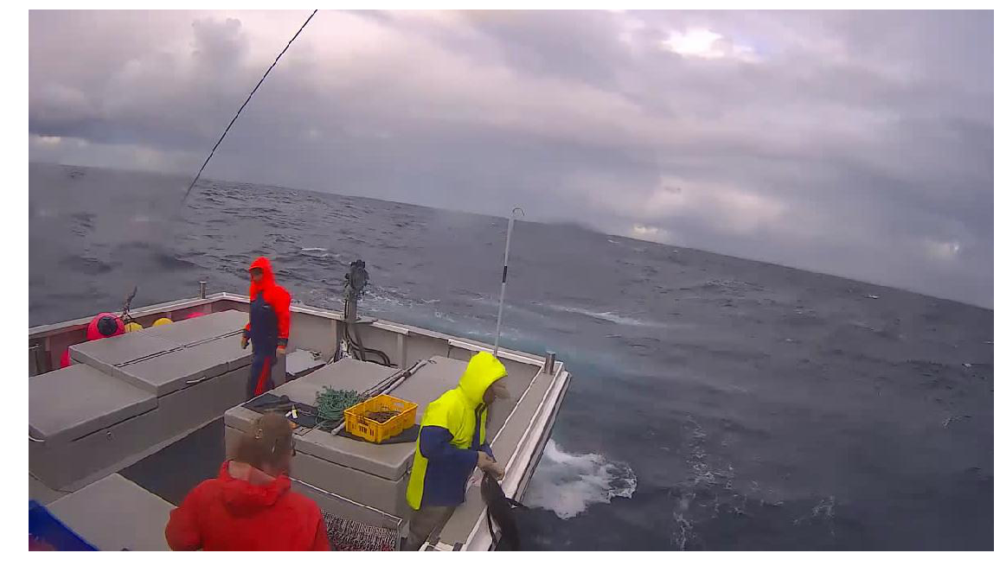

In [0]:
img_path = '/content/test_stg1/img_04130.jpg'
im = load(img_path)
imshow(im)

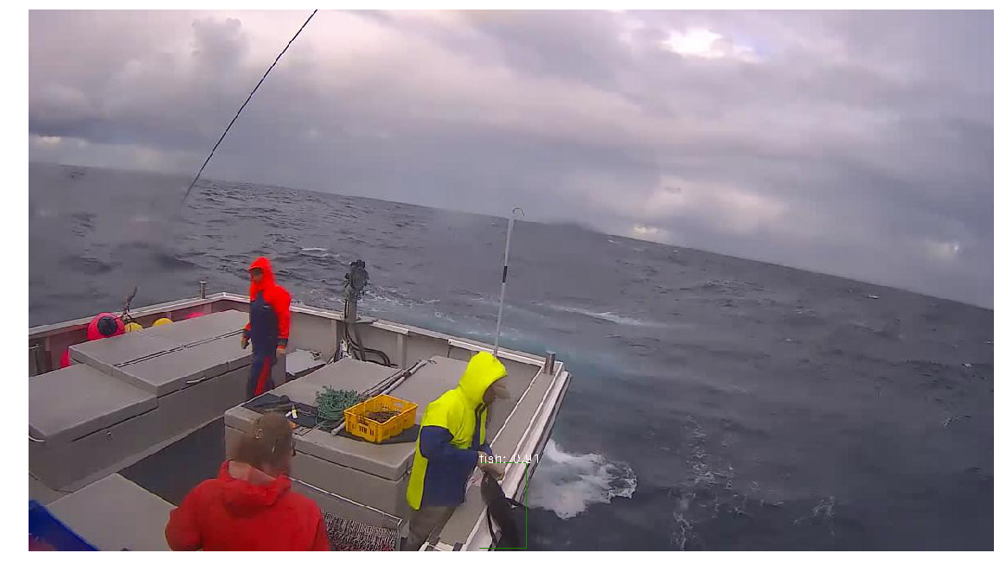

In [0]:
# compute predictions
predictions = coco_demo.run_on_opencv_image(im)
imshow(predictions)

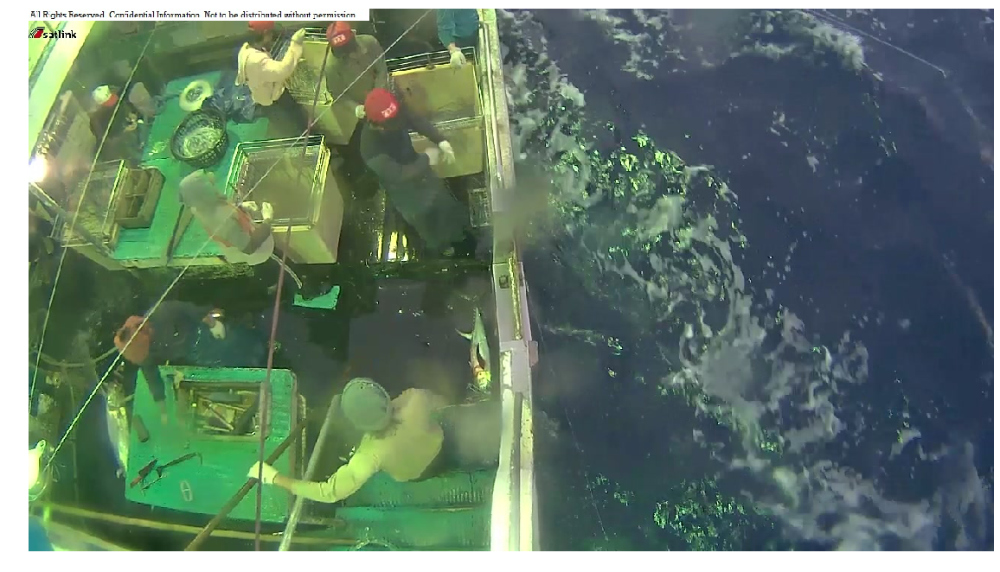

In [0]:
img_path = '/content/test_stg1/img_05953.jpg'
im = load(img_path)
imshow(im)

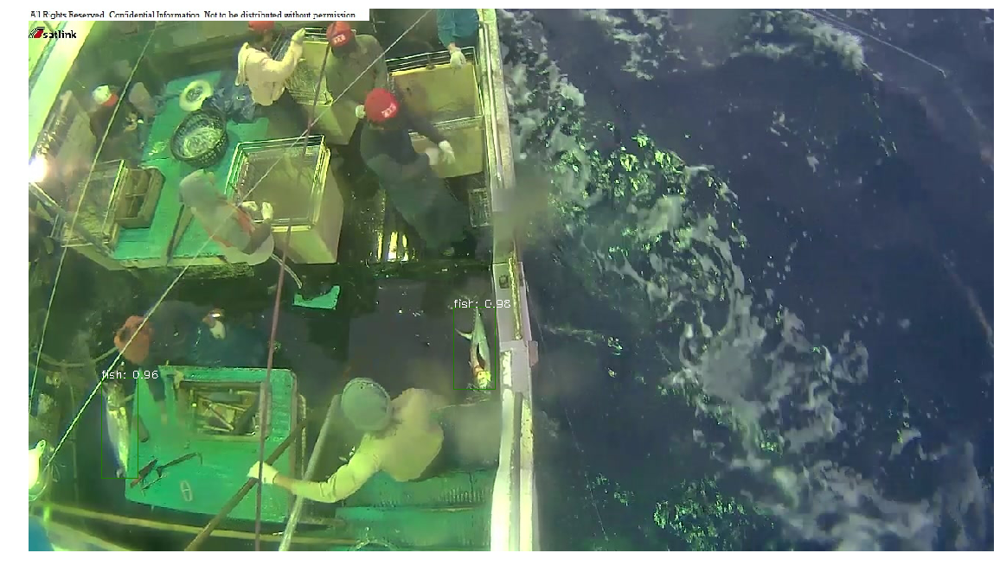

In [0]:
# compute predictions
predictions = coco_demo.run_on_opencv_image(im)
imshow(predictions)

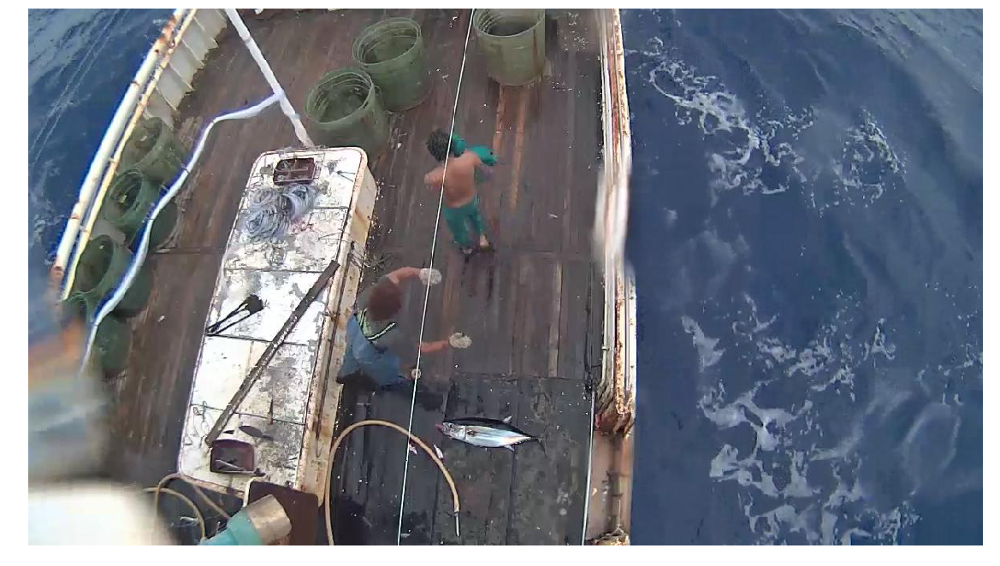

In [0]:
img_path = '/content/test_stg2/image_07014.jpg'
im = load(img_path)
imshow(im)

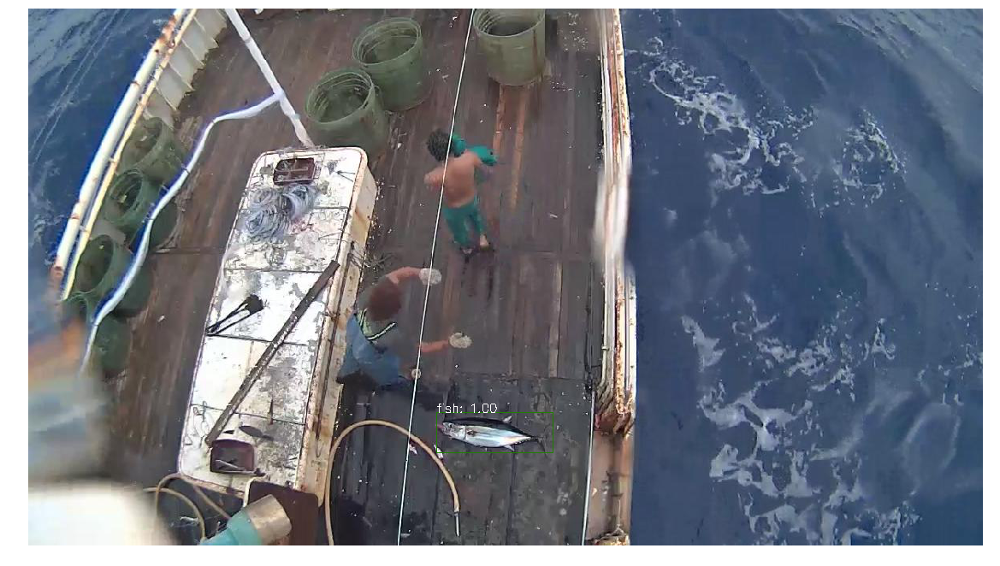

In [0]:
# compute predictions
predictions = coco_demo.run_on_opencv_image(im)
imshow(predictions)

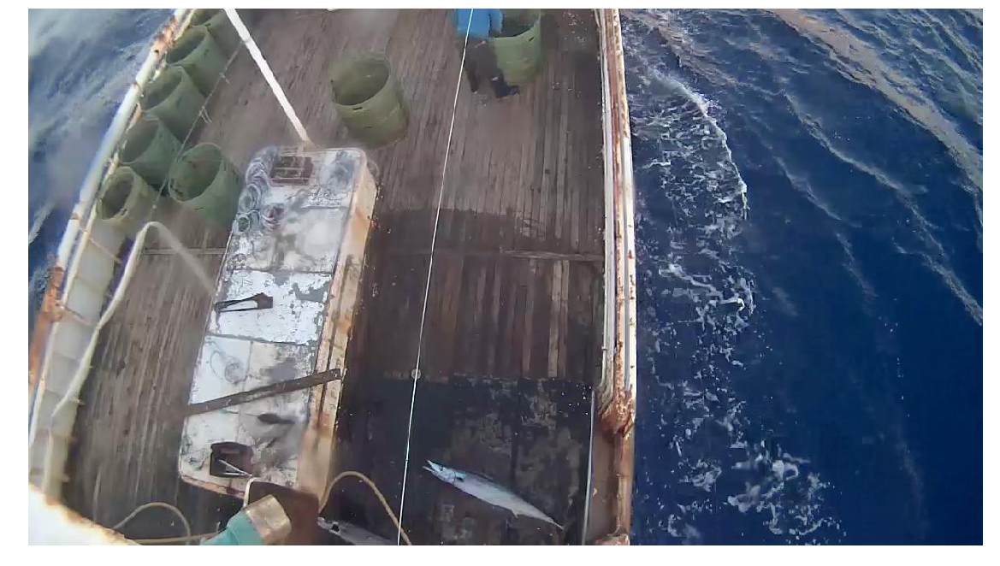

In [0]:
img_path = '/content/test_stg2/image_02502.jpg'
im = load(img_path)
imshow(im)

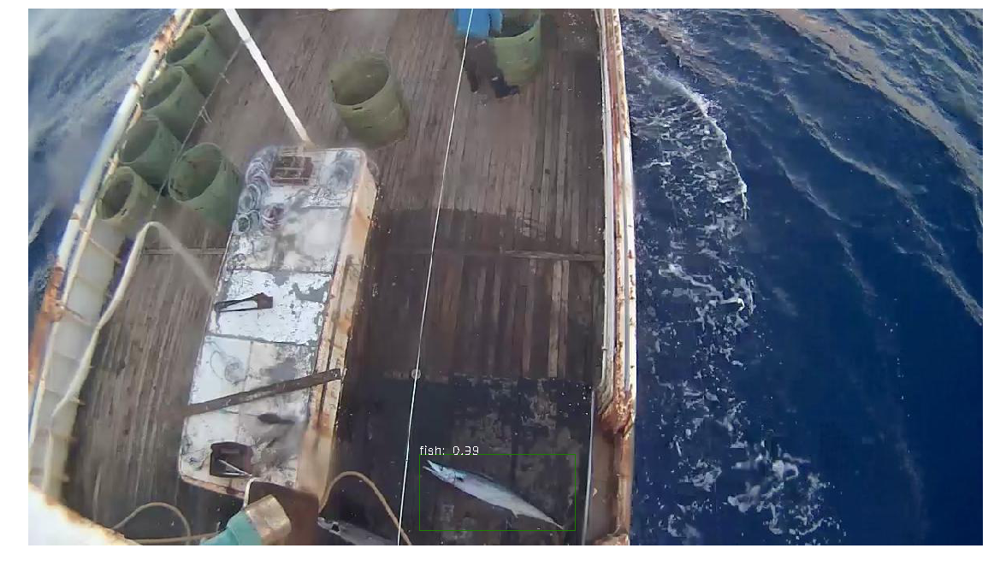

In [0]:
# compute predictions
predictions = coco_demo.run_on_opencv_image(im)
imshow(predictions)

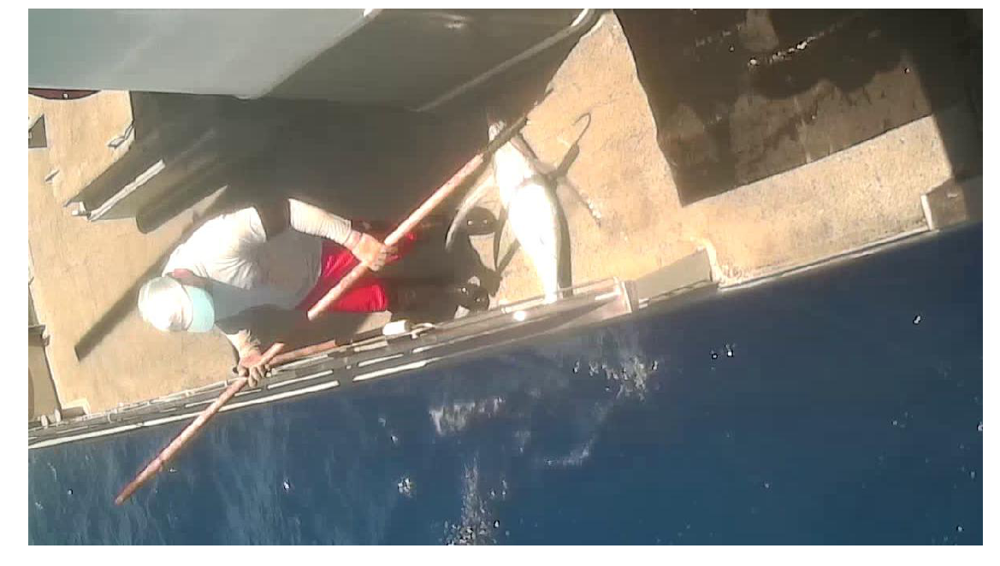

In [0]:
img_path = '/content/test_stg2/image_00506.jpg'
im = load(img_path)
imshow(im)

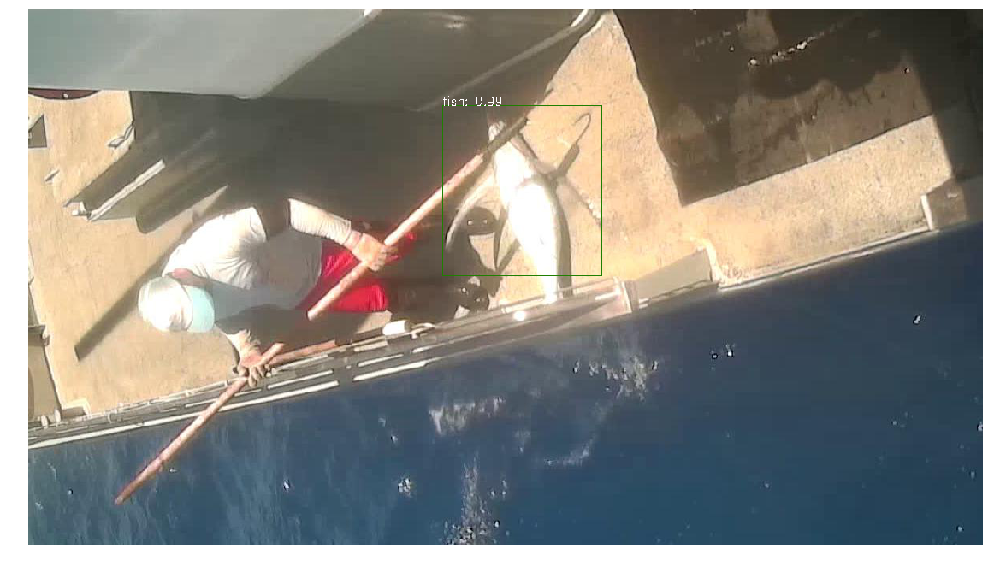

In [0]:
# compute predictions
predictions = coco_demo.run_on_opencv_image(im)
imshow(predictions)

### Save crops

In [0]:
test_files = [osp.join(d, fname) for d in ('test_stg1', 'test_stg2') for fname in os.listdir(d)]

In [0]:
%%time
for f in test_files:
    coco_demo.save_image_crops(f)

CPU times: user 42min 24s, sys: 12min 10s, total: 54min 34s
Wall time: 54min 50s


In [0]:
!cp -r /content/test_cls /content/drive/My\ Drive/DL_projects/cv_fish/